## Model Evaluation

In [1]:
import numpy as np
import pandas as pd
import os
import librosa
import seaborn as sns
import matplotlib.pyplot as plt
import IPython.display as ipd

from IPython.display import Image
from sklearn.metrics import confusion_matrix
from data_load import load_image_data
from reporting_functions import confusion_matrix_stats, plot_confusion_matrix_nn, get_tp_tn_lists, plot_loss, get_result_table, gather_results

In [2]:
# Use 3 decimal places in output display
pd.set_option("display.precision", 3)

# Don't wrap repr(DataFrame) across additional lines
pd.set_option("display.expand_frame_repr", False)

# Set max rows displayed in output to 25
pd.set_option("display.max_rows", 25)

In [3]:
# layer_dict = {
#     "c_1": Layer(c_1, getattr(circuit_presets, circ_name), "convolutional", circuit_options[circ_name], 0,),
#     "p_1": Layer(p_1, getattr(circuit_presets, "psatz1"), "pooling", pooling_options["psatz1"], 1,),
#     "c_2": Layer(c_2, getattr(circuit_presets, circ_name), "convolutional", circuit_options[circ_name], 2,),
#     "p_2": Layer(p_2, getattr(circuit_presets, "psatz1"), "pooling", pooling_options["psatz1"], 3,),
#     "c_3": Layer(c_3, getattr(circuit_presets, circ_name), "convolutional", circuit_options[circ_name], 4,),
#     "p_3": Layer(p_3, getattr(circuit_presets, "psatz1"), "pooling", pooling_options["psatz1"], 5,),
# }
# qcnn_structure = QcnnStructure(layer_dict)

In [4]:
embedding_options = {
    8: ["Angle"],
    12: [f"Angular-Hybrid2-{i}" for i in range(1, 5)],
    16: [f"Amplitude-Hybrid2-{i}" for i in range(1, 5)],
    30: [f"Angular-Hybrid4-{i}" for i in range(1, 5)],
    32: [f"Amplitude-Hybrid4-{i}" for i in range(1, 5)],
}

# Name of circuit function from circuit_presets.py along with paramater count
circuit_options = {
    "U_TTN": 2,
    "U_5": 10,
    "U_6": 10,
    "U_9": 2,
    "U_13": 6,
    "U_14": 6,
    "U_15": 4,
    "U_SO4": 6,
    "U_SU4": 15    
}
experiments_path = "../experiments"

In [5]:
experiment = 12
result_data = gather_results(f"{experiments_path}/{experiment}", circuit_options, embedding_options)

In [26]:
"pca-8-Angle-UTTN-param-history.csv" in os.listdir(f"{experiments_path}/{experiment}")

False

In [6]:
result_data

,model,circuit,circuit_param_count,reduction_method,reduction_size,embeded_full_name,embedding_class,embedding_permutation,accuracy,precision,recall,f1,loss_train_history,loss_test_history
0,pca-8-Angle-U_5,U_5,10.0,pca,8.0,Angle,Angle,1.0,0.400,0.391,0.290,0.333,0 18.076 1 19.435 2 18.096 3 ...,0 18.215 1 18.045 2 16.608 3 ...
1,pca-32-Amplitude-Hybrid4-4-U_5,U_5,10.0,pca,32.0,Amplitude-Hybrid4-4,Amplitude-Hybrid4,4,0.667,0.690,0.645,0.667,0 19.163 1 19.157 2 18.345 3 ...,0 18.824 1 18.742 2 20.307 3 ...


#### Accuracy

In [7]:
pd.set_option('display.max_rows', None)
get_result_table(result_data, "accuracy")

embeded_full_name,Amplitude-Hybrid4-4,Angle,Circuit Average
circuit,,,
U_5,0.667,0.4,0.533
Encoding Average,0.667,0.4,0.533


#### Precision

In [8]:
get_result_table(result_data, "precision")

embeded_full_name,Amplitude-Hybrid4-4,Angle,Circuit Average
circuit,,,
U_5,0.69,0.391,0.54
Encoding Average,0.69,0.391,0.54


#### Recall

In [9]:
get_result_table(result_data, "recall")

embeded_full_name,Amplitude-Hybrid4-4,Angle,Circuit Average
circuit,,,
U_5,0.645,0.29,0.468
Encoding Average,0.645,0.29,0.468


#### F1 - Score

In [10]:
get_result_table(result_data, "f1")

embeded_full_name,Amplitude-Hybrid4-4,Angle,Circuit Average
circuit,,,
U_5,0.667,0.333,0.5
Encoding Average,0.667,0.333,0.5


### Embedding Per Circuit for angular encoding

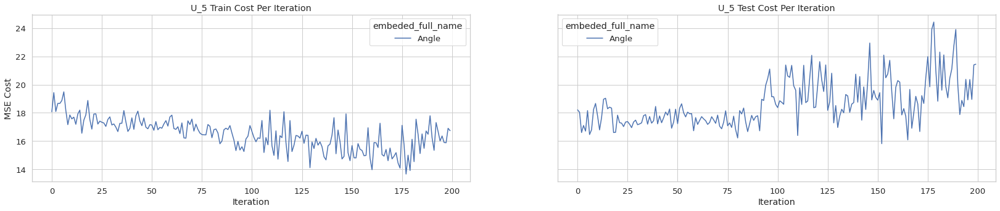

In [11]:
plot_loss(result_data, "circuit", "embeded_full_name", ["Angle", "Angular"], figsize=(28,5))

### Embedding Per Circuit for amplitude encoding

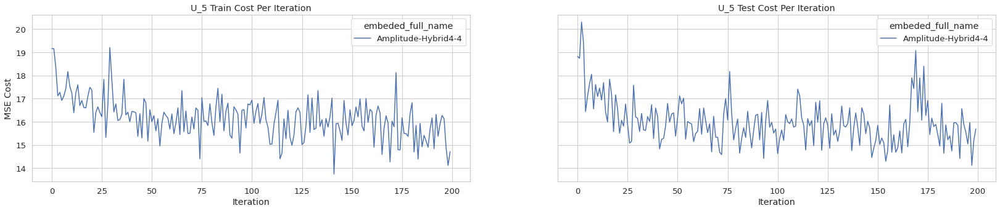

In [12]:
plot_loss(result_data, "circuit", "embeded_full_name", ["Amplitude"], figsize=(28,5))

### Circuit Per Embedding 

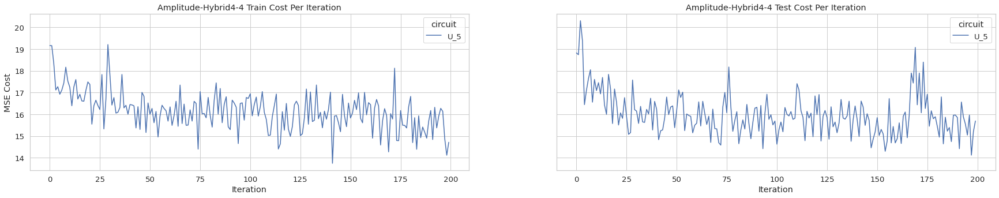

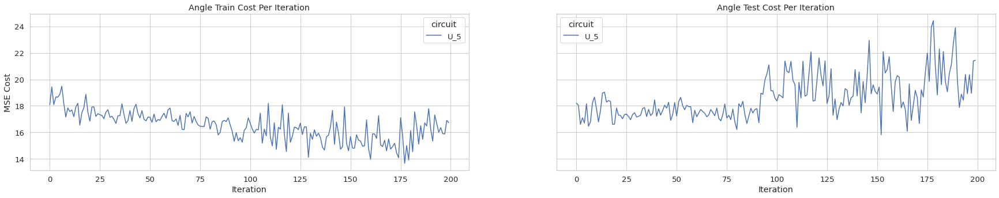

In [13]:
plot_loss(result_data, "embeded_full_name", "circuit", figsize=(30,5))

In [14]:
Image(filename=f"../data/Data/images_original/classical/classical00020.png")

FileNotFoundError: [Errno 2] No such file or directory: '../data/Data/images_original/classical/classical00020.png'

In [ ]:
model_name = "pca-8-Angle-U_5"
data_path = "../data/archive/Data/features_30_sec.csv"
audio_path = "../data/archive/Data/genres_original"
target = "label"
classes = ["pop", "classical"]

In [36]:
# Load results
cf_matrix = pd.read_csv(f"../results/{model_name}-confusion-matrix.csv", index_col=0)
loss_history = pd.read_csv(f"../results/{model_name}-loss-history.csv")
loss_test_history = pd.read_csv(f"../results/{model_name}-loss-test-history.csv")
estimate_vs_class = pd.read_csv(f"../results/{model_name}-yhat-class-vs-y-test.csv", index_col=0)
y_hat = pd.read_csv(f"../results/{model_name}-yhat.csv", index_col=0)

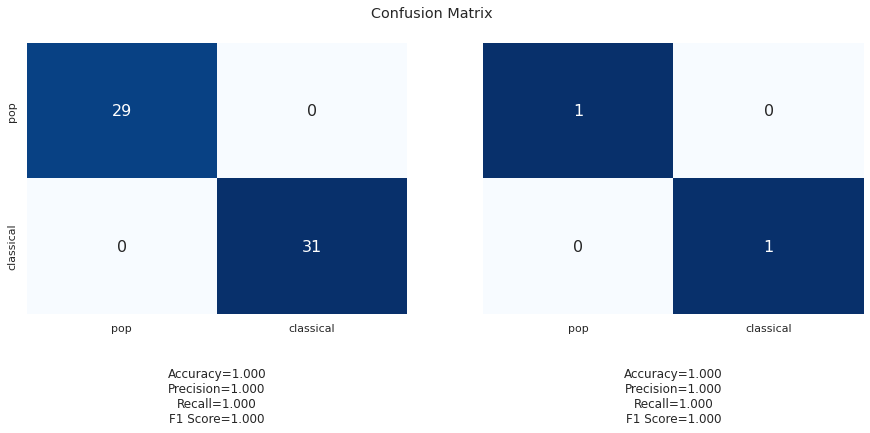

In [37]:
# Plot Confusion Matrix
_, _, _, _, stats_text = confusion_matrix_stats(cf_matrix)
plot_confusion_matrix_nn(cf_matrix, classes, stats_text)

In [38]:
y_hat

,0,1
0,0.230,0.770
1,0.132,0.868
2,0.106,0.894
3,0.927,0.073
4,0.799,0.201
5,0.902,0.098
6,0.232,0.768
7,0.947,0.053
8,0.981,0.019
9,0.146,0.854


In [39]:
loss_history.columns = ["Iteration", "Train_Cost"]
loss_test_history.columns = ["Iteration", "Test_Cost"]
loss_history = loss_history.set_index("Iteration")
loss_test_history = loss_test_history.set_index("Iteration")
loss_data = loss_history.join(loss_test_history, on="Iteration", how="left")
loss_data["Iteration"] = loss_data.index
plot_data = pd.melt(loss_data, "Iteration", value_name="MSE Cost", var_name="Sample")

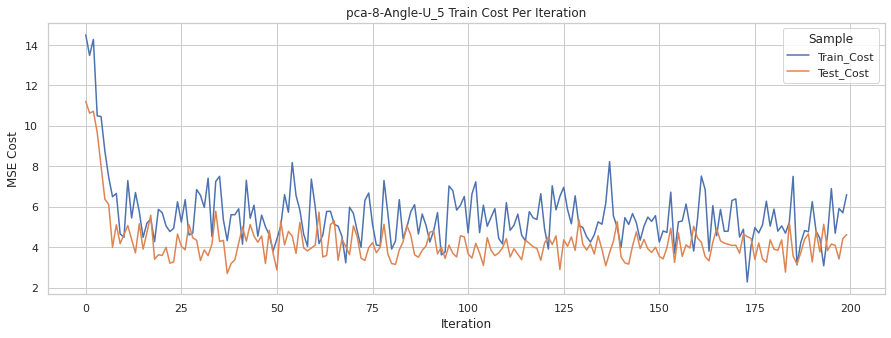

In [41]:
with sns.axes_style("whitegrid"):
    fig, axes = plt.subplots(1, 1, figsize=(15, 5))
    sns.lineplot(
        ax=axes,
        data=plot_data,
        x="Iteration",
        y="MSE Cost",
        hue="Sample",
        markers=True,
        dashes=False,
    )
    axes.set_title(f"{model_name} Train Cost Per Iteration")


In [61]:
Xy = pd.read_csv(data_path)

# returns "classical|pop" etc depending on class selection
filter_pat = "|".join(genre for genre in classes)
indices = Xy["filename"].str.contains(filter_pat)

# Select only data for relevant classes
Xy = Xy.loc[indices, :].copy()

X_train, y_train, X_test, y_test = load_image_data(data_path, classes, target)
estimate_vs_class.index = y_test.index
y_hat.index = y_test.index

In [43]:
TP, TN, FP, FN = get_tp_tn_lists(estimate_vs_class, y_test)

In [44]:
def get_rnd_audio_sample(data, class_type, target="label"):    
    idx = data.loc[class_type[class_type==True].sample(1).index].index
    filename, genre = data.loc[idx, "filename"].iloc[0], data.loc[idx, target].iloc[0]
    return filename, genre

def plot_spectogram(audio_path, filename, genre):
    audio_ts , sample_rate = librosa.load(f"{audio_path}/{genre}/{filename}")
    X = librosa.stft(audio_ts)
    Xdb = librosa.amplitude_to_db(abs(X))
    plt.figure(figsize=(20,10))
    librosa.display.specshow(Xdb, sr=sample_rate, x_axis='time', y_axis='log')
    plt.colorbar()

In [73]:
certainty = np.sqrt((y_hat.iloc[:,0] - y_hat.iloc[:,1])**2)
min_certainty_key = np.where(min(certainty)==certainty)[0][0]
idx = y_hat.iloc[uncertain_key,:].name

In [74]:
filename, genre = Xy.loc[idx, "filename"], Xy.loc[idx, target]

In [75]:
print(f"Example of minmal certainty {filename} predicted as {genre}\n")
ipd.Audio(f"{audio_path}/{genre}/{filename}")

Example of minmal certainty pop.00037.wav predicted as pop



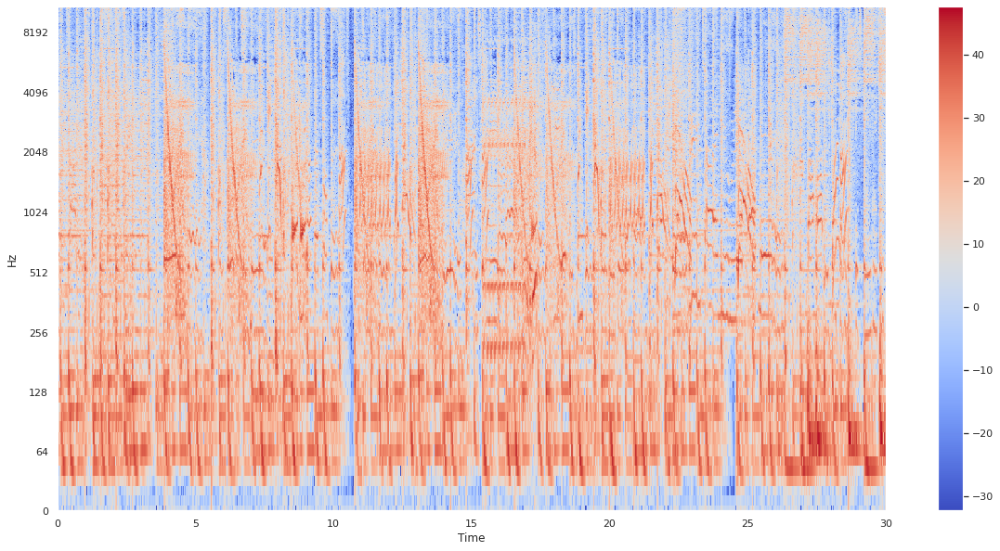

In [76]:
plot_spectogram(audio_path, filename, genre)

In [77]:
filename, genre = get_rnd_audio_sample(Xy, TP)
#filename, genre = "classical.00029.wav", classes[1]
print(f"Example of true positive {filename} predicted as {classes[1]}\n")
ipd.Audio(f"{audio_path}/{genre}/{filename}")

Example of true positive classical.00067.wav predicted as classical



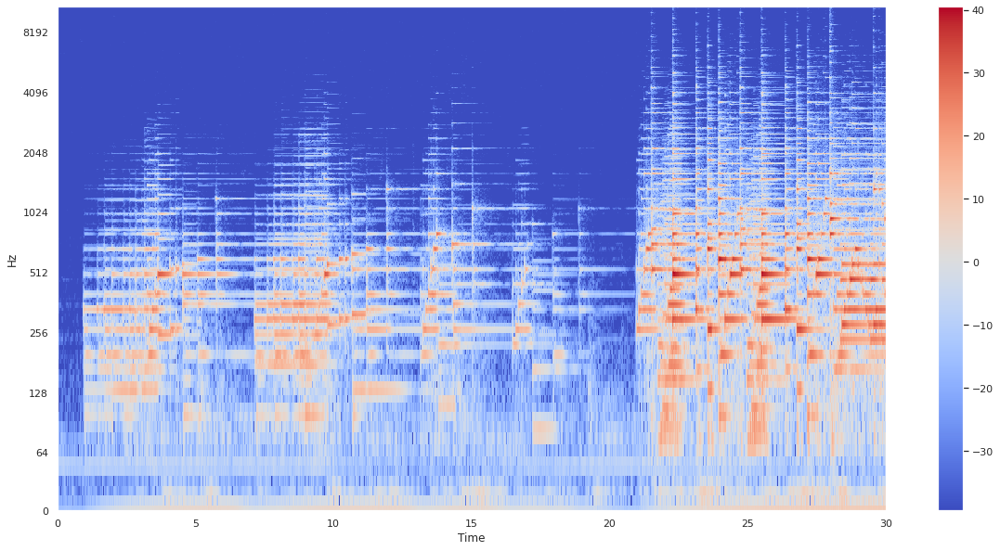

In [78]:
plot_spectogram(audio_path, filename, genre)

In [80]:
#filename, genre = get_rnd_audio_sample(Xy, FP)
filename, genre = "pop.00040.wav", classes[0]
print(f"Example of false positive {filename} model predicted {classes[1]}\n")
ipd.Audio(f"{audio_path}/{genre}/{filename}")

Example of false positive pop.00040.wav model predicted classical



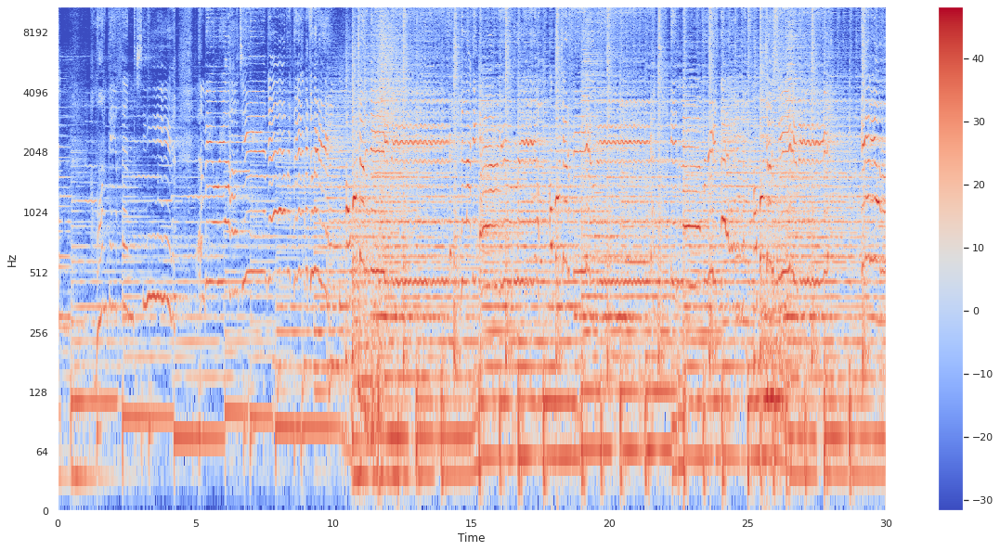

In [81]:
plot_spectogram(audio_path, filename, genre)

In [71]:
# filename, genre = get_rnd_audio_sample(Xy, FN)
filename, genre = "classical.00076.wav", classes[1]
print(f"Example of false negative {filename} predicted as {classes[0]}\n")

ipd.Audio(f"{audio_path}/{genre}/{filename}")

Example of false negative classical.00076.wav predicted as pop



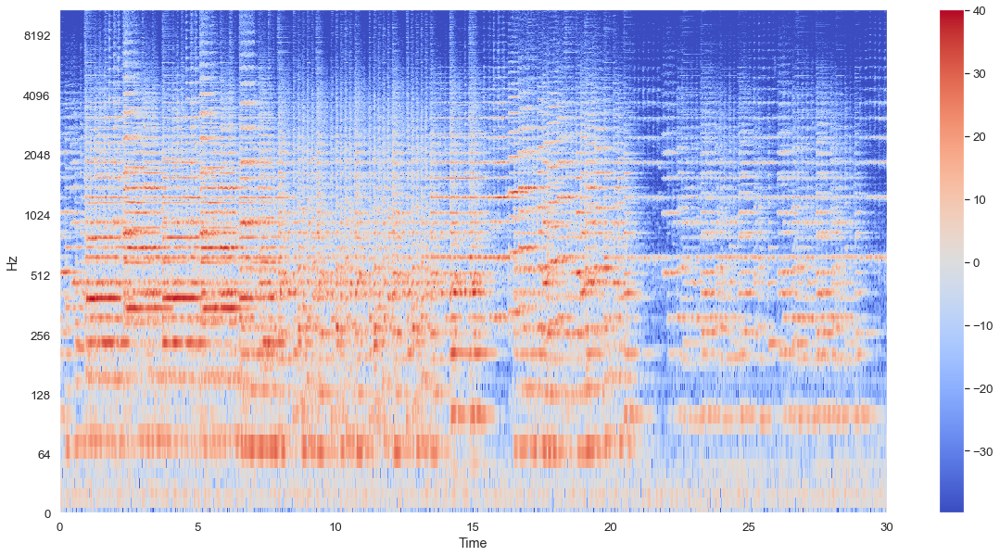

In [72]:
plot_spectogram(audio_path, filename, genre)

In [82]:
filename, genre = get_rnd_audio_sample(Xy, TN)
# filename, genre = "pop.00028.wav", classes[0]
print(f"Example of true negative {filename} predicted as {classes[0]}\n")
ipd.Audio(f"{audio_path}/{genre}/{filename}")

Example of true negative pop.00004.wav predicted as pop



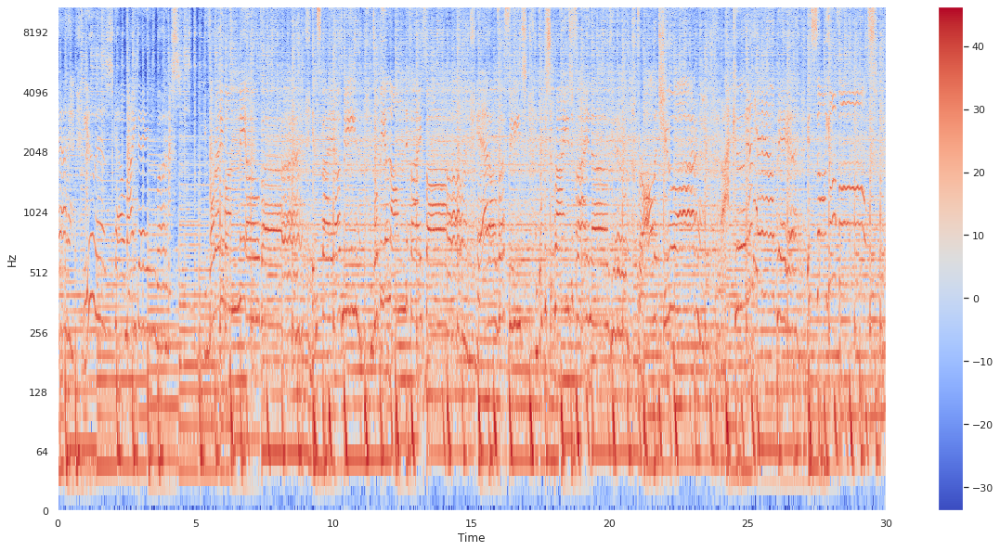

In [83]:
plot_spectogram(audio_path, filename, genre)